# Введение в машинное обучение, АБД

## НИУ ВШЭ, 2025-26 учебный год

# Домашнее задание 1. Часть 2. Регрессия и инференс модели

Задание выполнил(а):

    Плотко Александра

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
*  реализовать веб-сервис для применения построенной модели на новых данных

> Оценка за домашнее задание = $min(\text{ваш балл}, 33)$

## Общая информация

__Внимание!__  

* Домашнее задание выполняется самостоятельно
* Не допускается помощь в решении домашнего задания от однокурсников или третьих лиц. «Похожие» решения считаются плагиатом, и все задействованные студенты — в том числе и те, у кого списали, — не могут получить за него больше 0 баллов
* Использование в решении домашнего задания за рамками справочной и образовательной информации генеративных моделей (ChatGPT и так далее) для генерации кода задания считается плагиатом, и такое домашнее задание оценивается в 0 баллов

**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов или все баллы за соответствующее задание снимается.

## Импорт библиотек, установка констант

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns

In [3]:
CARS_TRAIN = 'https://github.com/evgpat/datasets/raw/refs/heads/main/cars_train.csv'
CARS_TEST = 'https://github.com/evgpat/datasets/raw/refs/heads/main/cars_test.csv'

In [4]:
RANDOM_STATE = 42

In [5]:
random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)

## Задание 0

Для чего фиксируем сиды в ноутбуке?

`Чтобы прри пепезапуске рандомайзеров, они возвращали фиксированный 'рандомный' результат. А не каждый раз новый набор. Таким образом можно получать ожидаемй результат при тестировании или проверке работы.`

## Часть 1 | EDA




Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков
- Визуализации признаков и их анализ

В следующих частях вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (4.5 балла)**

In [6]:
df_train = pd.read_csv(CARS_TRAIN)
df_test = pd.read_csv(CARS_TEST)

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(1.2 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling) (0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла)

In [7]:
import ydata_profiling
from ydata_profiling import ProfileReport

In [8]:
na_counts_train = df_train.isna().sum()
na_counts_test = df_test.isna().sum()


print(
    'Есть пропущенные значения в train:\n',na_counts_train.loc[na_counts_train>0],
      '\nКол-во дублирующихся строк:', df_train.duplicated().sum() 
     )

print(
    '\nЕсть пропущенные значения в test:\n',na_counts_test.loc[na_counts_test>0], 
      'Кол-во дублирующихся строк:', df_test.duplicated().sum() 
     )

Есть пропущенные значения в train:
 mileage      202
engine       202
max_power    196
torque       203
seats        202
dtype: int64 
Кол-во дублирующихся строк: 985

Есть пропущенные значения в test:
 mileage      19
engine       19
max_power    19
torque       19
seats        19
dtype: int64 Кол-во дублирующихся строк: 62


In [161]:
profile_train = ProfileReport(df_train, title='train report')
profile_train.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|███████████████████████████████████████████| 15/15 [00:00<00:00, 78.99it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
profile_test = ProfileReport(df_test, title='test report')
profile_test.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|█████████████████████████████████████████| 13/13 [00:00<00:00, 8586.76it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

1. Первое на что стоит обрратить внимание, что **ProfileReport неверно считает дубли**. Это хорошо видно в примере ниже.
Там, где пандас возвращает 3, ProfileReport - 0. В github пользователи тоже на это жалуются. 
2. Из того на что стоит обратить внимнаие в данных. Ожидаемо **год, цена и пробег коррелириют между собой**. Чем  старше год, тем больше пробег и ниже цена продажи. Это видно и в test, и в train выборке. 
Из этого можем сделать вывод, что это будут наиболее влияющие количественные признаки. 
3. Данные по цене и пробегу сильно разбросаны. Распределения смещены влево.
4. По качественным признакам сложно сдлеать вывод, так как дашборд не содержит визуализации зависимости целевой переменной от качественных признаков. А хотелось бы посомтреть, сколько, например,  в среднем стоит машина в каждой категории топлива или типе двигателя. 
5. Также виджет подсвечивает, что в **train данных пропущено почти 3%**, в **test почти 2%**. Что является проблемой для линейной регресии. Если их не обработать, код упадет с ошибкой. Далее в процессе анализа, посмотрим, что с ними делать. В целом 2% - это не много, но если еще убрать дублирующиеся строки, которые не несут качественно новых данных, мы можем потерять часть данных.

In [11]:
# проблема с дублями в ProfileReport
df = pd.DataFrame(
    {'a': [None, None, 2, 2, 2, 2, 'a', 'a','a'],
     'b': [1, 1, 3, None, None, 3, 'c', 'a', None], 
     'c': [1, 1, 3, 2, 2, 3, 'b', 'a', 'a']
    }
)
print('Кол-во дублей', df.duplicated().sum())

Кол-во дублей 3


In [12]:
df

,a,b,c
0,None,1,1
1,None,1,1
2,2,3,3
3,2,None,2
4,2,None,2
5,2,3,3
6,a,c,b
7,a,a,a
8,a,None,a


In [13]:
profile = ProfileReport(df, title='Duplicate Test')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████| 3/3 [00:00<00:00, 36054.19it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### **Задание 2 (0.6 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [14]:
# TRAIN continuous
train_continuous = df_train.describe()
train_continuous

,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


In [17]:
# TEST continuous
test_continuous = df_test.describe()
test_continuous

,year,selling_price,km_driven,seats
count,1000.000000,1.000000e+03,1000.000000,981.000000
mean,2013.681000,6.179010e+05,71393.341000,5.410805
std,4.012149,7.585539e+05,48486.218662,0.919985
min,1995.000000,3.100000e+04,1303.000000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000


In [9]:
# TRAIN objects
train_objects = df_train.describe(include='object')
train_objects

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


In [16]:
# TEST objects
test_objects = df_test.describe(include='object')
test_objects

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,1000,1000,1000,1000,1000,981,981,981,981
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,43,57


In [18]:
#среднее и медиана
comparison = pd.DataFrame({
    'train_mean': train_continuous.loc['mean'],
    'train_median': train_continuous.loc['50%'],
    'test_mean': test_continuous.loc['mean'],
    'test_median': test_continuous.loc['50%']
})
comparison['diff_mean'] = abs(comparison['train_mean'] - comparison['test_mean'])
comparison['diff_median'] = abs(comparison['train_median'] - comparison['test_median'])
comparison

,train_mean,train_median,test_mean,test_median,diff_mean,diff_median
year,2013.818403,2015.0,2013.681000,2014.0,0.137403,1.0
selling_price,639515.197171,450000.0,617901.042000,434999.0,21614.155171,15001.0
km_driven,69584.615517,60000.0,71393.341000,61500.0,1808.725483,1500.0
seats,5.419008,5.0,5.410805,5.0,0.008203,0.0


Сравнение среднего и медианы
1. Внутри **train** по неприрывным признакам: **selling_price, km_driven** среднее выше медианы, значит распределение имеет хвост и/или имеет выбросы справа. По визуализациям из дэша мы видим выбросы справа у обоих признаков.  По дискретному признаку **year** среднее меньше медианы, можем сделать вывод что распределение имеет хвост и/или имеет выбросы слева. По дискретному признаку **seats** среденее выше медианы, осюда мы можем сделать вывод, что распределение также имеет хвсот и/или есть выбросы справа. Здесь я использую и/или для описания смещения распределения и выбросов, потому что не каждый хвост можно считать выбросами. У распределения может тянуться длинный хвост, но значения не будут выбросами, просто форма распределения сглажена и будет большое std. В то же время распределение, если у него убрать выбрососв, может обладать признаками нормальности или быть семитричным, где медиана, мода и среднее равны (при условии что оно унимодальное и неравномерное). В последнем случае на отличие среднего и мадианы будут влиять сами выбросы.

2. Внутри **test** описательные статистики по этим признакам ведут сбея идентично train. 

3. Если сравнивать **статистики между группами**, то мы видим что разница медиан намного меньше, чем разница средних. Это как раз может быть связано с выбросами, которые при попадании в группу смещают среднее. Соотвественно в обе группы попали выбросы, но они настолько большие в своем отличии (в случае с selling_price), что имею сильное влияние на разницу средних, тогда как медиана остается более стабильна. 

### **Задание 3 (0.6 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.05 балла)
- [ ] Отобразите такие объекты (0.05 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.05 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.05 балла)

In [19]:
duplicated_mask = df_train.drop(columns=['selling_price']).duplicated()
print('Кол-во дублей в train:', duplicated_mask.sum())

Кол-во дублей в train: 1159


In [20]:
# дубли
df_train.loc[duplicated_mask]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
268,Maruti Swift Dzire VXI,2014,400000,70000,Petrol,Individual,Manual,Second Owner,19.1 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,140000,60000,Petrol,Individual,Manual,Second Owner,18.0 kmpl,995 CC,62 bhp,90.3Nm@ 4200rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


In [21]:
df_train = df_train[~duplicated_mask]

In [22]:
df_train = df_train.reset_index(drop=True)

In [23]:
assert df_train.shape == (5840, 13)

### **Задание 4 (0.6 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными, они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [13]:
df_train.dtypes

name              object
year               int64
selling_price      int64
km_driven          int64
fuel              object
seller_type       object
transmission      object
owner             object
mileage           object
engine            object
max_power         object
torque            object
seats            float64
dtype: object

In [24]:
def clean_str(string, symbol):
    return str(string).split()[0] 

In [25]:
df_train['mileage'] = df_train['mileage'].apply(lambda x: clean_str(x, 'kmpl'))
df_test['mileage'] = df_test['mileage'].apply(lambda x: clean_str(x, 'kmpl'))

df_train['engine'] = df_train['engine'].apply(lambda x: clean_str(x, 'CC'))
df_test['engine'] = df_test['engine'].apply(lambda x: clean_str(x, 'CC'))

df_train['max_power'] = df_train['max_power'].apply(lambda x: clean_str(x, 'bhp'))
df_test['max_power'] = df_test['max_power'].apply(lambda x: clean_str(x, 'bhp'))

In [26]:
df_train['mileage'] = pd.to_numeric(df_train['mileage'], errors='coerce')
df_train['engine'] = pd.to_numeric(df_train['engine'], errors='coerce')
df_train['max_power'] = pd.to_numeric(df_train['max_power'], errors='coerce')

df_test['mileage'] = pd.to_numeric(df_test['mileage'], errors='coerce')
df_test['engine'] = pd.to_numeric(df_test['engine'], errors='coerce')
df_test['max_power'] = pd.to_numeric(df_test['max_power'], errors='coerce')

In [27]:
import re
def get_rpm(x):
    text = str(x).replace(',', '').lower()

    numbers = re.findall(r'(\d+)\s*rpm', text)
    if numbers:
        return max(map(int, numbers))
    match = re.search(r'[@at/]\s*(\d+(?:[-\s]\d+)*)', text)
    if match:
        numbers = re.findall(r'\d+', match.group(1))
        if numbers:
            return max(map(int, numbers))
    
    return None

In [28]:
def get_torque(x):
    text = str(x).replace(',', '').lower()
    
    torque_match = re.search(r'(\d+\.?\d*)', text)
    torque = float(torque_match.group(1)) if torque_match else None

    if 'kgm' in text:
        torque = torque * 9.81
    return torque

In [29]:
df_train['max_torque_rpm'] = df_train['torque'].apply(get_rpm)
df_test['max_torque_rpm'] = df_test['torque'].apply(get_rpm)
df_train['torque'] = df_train['torque'].apply(get_torque)
df_test['torque'] = df_test['torque'].apply(get_torque)

In [30]:
df_train.dtypes

name               object
year                int64
selling_price       int64
km_driven           int64
fuel               object
seller_type        object
transmission       object
owner              object
mileage           float64
engine            float64
max_power         float64
torque            float64
seats             float64
max_torque_rpm    float64
dtype: object

### **Задание 5 (0.6 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






In [31]:
# делаем копии до заполнения медианой, чтобы сравнить статистики до/после
df_train_1 = df_train.copy()
df_test_1 = df_test.copy()

In [32]:
continuous_cols = ['mileage', 'engine', 'max_power', 'seats', 'torque', 'max_torque_rpm']
for col in continuous_cols:
    median_val = df_train[col].median()
    df_train[col] = df_train[col].fillna(median_val)
    df_test[col] = df_test[col].fillna(median_val)

print('Пропуски в train:\n', df_train[continuous_cols].isna().sum())
print('Пропуски в test:\n', df_test[continuous_cols].isna().sum())

Пропуски в train:
 mileage           0
engine            0
max_power         0
seats             0
torque            0
max_torque_rpm    0
dtype: int64
Пропуски в test:
 mileage           0
engine            0
max_power         0
seats             0
torque            0
max_torque_rpm    0
dtype: int64


`Как мы писали ранее сравнивания медиану и среднее, медиана более устойчива к выбросам, в нашем случае она лучше показывает типичное знаечние чем среднее, на котороее влияют выбросы.
Мы заполнили все данные медианой из train, так как при поступлении новых данных 'test' для предсказания цены модель не будет ничего знать о медиане этих данных. Поэтому мы заполняем данные медианой train
`

### **Задание 6 (0.6 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [44]:
df_train['engine'] = df_train['engine'].astype(int)
df_test['engine'] = df_test['engine'].astype(int)

df_train['seats'] = df_train['seats'].astype(int)
df_test['seats'] = df_test['seats'].astype(int)

print('train\n', df_train[['engine', 'seats']].dtypes)
print('\ntest\n', df_test[['engine', 'seats']].dtypes)

train
 engine    int64
seats     int64
dtype: object

test
 engine    int64
seats     int64
dtype: object


`seats имеет мало уникальных значений, поэтому может рассматриваться как категориальная переменная, также  seats представляет собой дискретные данные. Кол-во мест скорее является качественной характеристикой автомобиля, как цвет, тип кузова и др.`

In [36]:
df_train['seats'].unique()

array([ 5,  4,  7,  8,  6,  9, 10, 14,  2])

### **Задание 7 (0.3 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [26]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.430841,1429.448973,87.906371,175.935918,5.426712,3040.395205
std,4.095622,5.354320e+05,6.007114e+04,3.985973,485.662834,31.640418,116.779426,0.982344,915.723610
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,47.088000,2.000000,500.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,111.800000,5.000000,2250.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.370000,1248.000000,81.860000,160.000000,5.000000,3000.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,200.124000,5.000000,4000.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,3727.800000,14.000000,21800.000000


In [269]:
# копия до заполнения пропусков
df_train_1.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.000000,5.840000e+03,5.840000e+03,5654.000000,5654.000000,5656.000000,5653.000000,5654.00000,5650.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.432842,1435.418111,88.103070,176.463075,5.44075,3041.753628
std,4.095622,5.354320e+05,6.007114e+04,4.051002,492.453262,32.131943,118.658996,0.99527,930.965633
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,47.088000,2.00000,500.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.800000,1197.000000,68.000000,111.700000,5.00000,2250.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.370000,1248.000000,81.860000,160.000000,5.00000,3000.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.320000,1498.000000,100.000000,200.124000,5.00000,4000.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,3727.800000,14.00000,21800.000000


In [270]:
df_test.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,1000.000000,1.000000e+03,1000.000000,1000.00000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,19.33881,1454.87600,90.841670,177.621834,5.403000,3091.276000
std,4.012149,7.585539e+05,48486.218662,3.95175,521.99574,34.893389,103.745986,0.912921,883.869772
min,1995.000000,3.100000e+04,1303.000000,0.00000,624.00000,34.200000,48.000000,4.000000,500.000000
25%,2011.000000,2.500000e+05,37000.000000,16.55000,1197.00000,69.000000,111.700000,5.000000,2500.000000
50%,2014.000000,4.349990e+05,61500.000000,19.37000,1248.00000,82.425000,160.000000,5.000000,3000.000000
75%,2017.000000,6.700000e+05,100000.000000,22.30000,1582.00000,102.000000,205.000000,5.000000,4000.000000
max,2020.000000,6.000000e+06,375000.000000,32.26000,3604.00000,280.000000,1422.450000,9.000000,5200.000000


In [271]:
# копия до заполнения пропусков
df_test_1.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,1000.000000,1.000000e+03,1000.000000,981.000000,981.000000,981.000000,981.000000,981.000000,977.000000
mean,2013.681000,6.179010e+05,71393.341000,19.338206,1458.882773,91.015627,177.963134,5.410805,3093.424770
std,4.012149,7.585539e+05,48486.218662,3.989872,526.228560,35.207383,104.717560,0.919985,894.111209
min,1995.000000,3.100000e+04,1303.000000,0.000000,624.000000,34.200000,48.000000,4.000000,500.000000
25%,2011.000000,2.500000e+05,37000.000000,16.500000,1197.000000,69.000000,110.000000,5.000000,2500.000000
50%,2014.000000,4.349990e+05,61500.000000,19.330000,1248.000000,83.100000,171.600000,5.000000,3000.000000
75%,2017.000000,6.700000e+05,100000.000000,22.320000,1582.000000,102.000000,213.000000,5.000000,4000.000000
max,2020.000000,6.000000e+06,375000.000000,32.260000,3604.000000,280.000000,1422.450000,9.000000,5200.000000


`Рассмотрим копии датасетов, сделанные до заполнения пропусков. Заполнение данных медианой не должно сильно сдвинуть распределение, потому что медиана - устойчивая статистика для выбросов. Мы добавили данные в центр распределения, а не в хвосты. Поэтому мы видим незначительное влияние (в несколько десятых) на среднее и на std (уменьшение, так как мы добавили данные в центр распределения). Стоит еще обратить внимание, что мы удалили дубли, это тоже повлияло на данные. Например, незначительно изменилось среднее и медиана для year, selling_price, km_driven`

## **Визуализации и корреляция (4.8 балла + 0.3)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (1.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

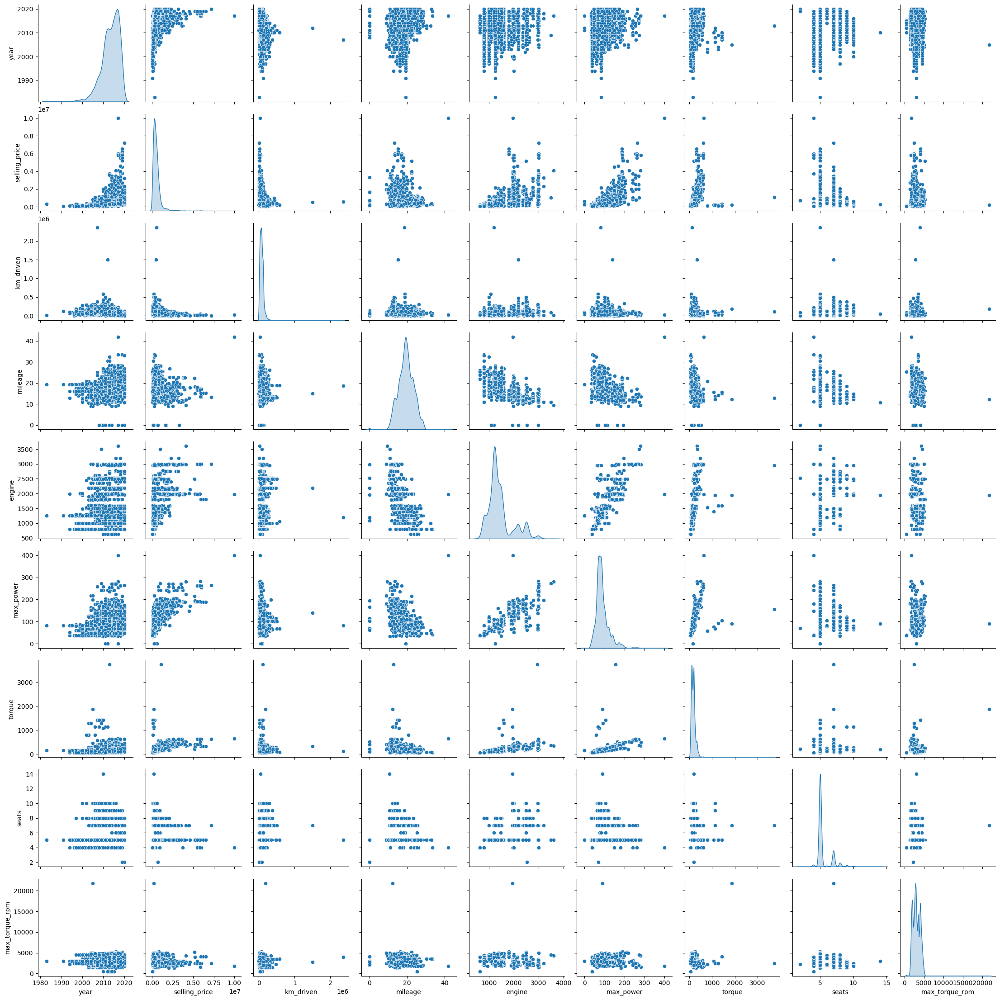

In [277]:
numeric_features = ['year', 'selling_price', 'km_driven', 
                    'mileage', 'engine', 'max_power','torque', 'seats', 'max_torque_rpm']

sns.pairplot(df_train[numeric_features], diag_kind='kde')
plt.show()

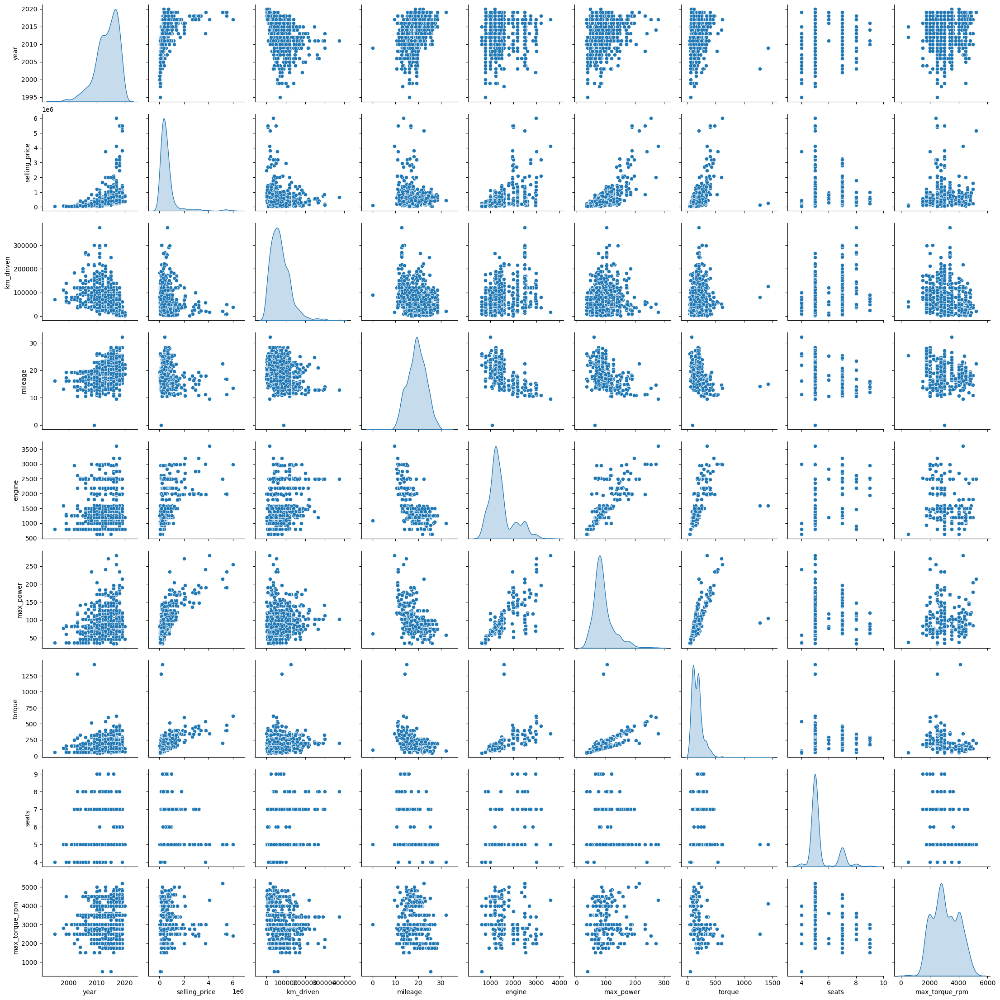

In [278]:
sns.pairplot(df_test[numeric_features], diag_kind='kde')
plt.show()

`Шаг 1 На основании распределений можем предположить связь year, torque, max_power, engine c целевой переменной, а так же корреляцию между признаками: torque и engine, torque и max_power, engine и max_power
Шаг 2 Судя по распределениям совокупности похожи, например прослеживается мультимодальность в распределениях, но test захватил меньше выбросов`

### **Задание 9 (1.5 балла)**

Итак, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

Корреляция признаков с selling_price
selling_price     1.000000
max_power         0.692814
engine            0.447672
torque            0.433026
year              0.427279
seats             0.149953
max_torque_rpm   -0.082755
mileage          -0.104769
km_driven        -0.164828
Name: selling_price, dtype: float64


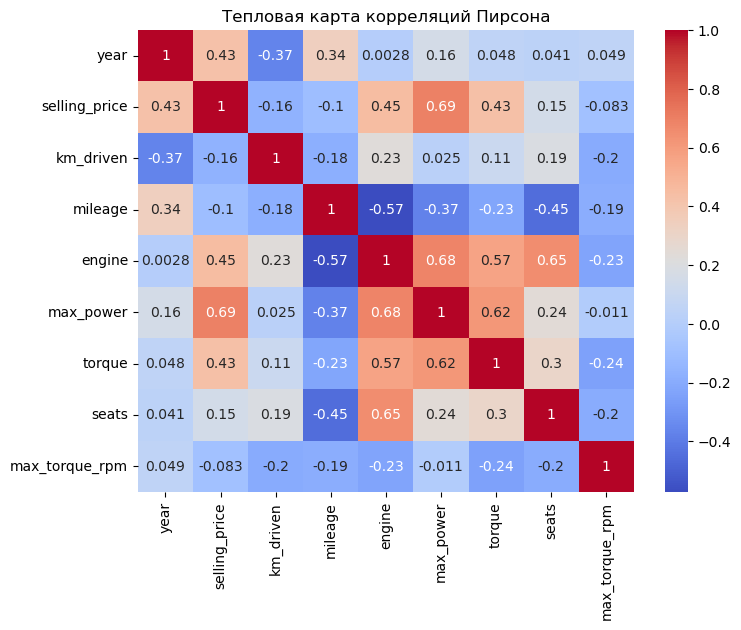

In [315]:
correlation_matrix = df_train[numeric_features].corr()
print('Корреляция признаков с selling_price')
print(correlation_matrix['selling_price'].sort_values(ascending=False))

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, 
            annot=True,      
            cmap='coolwarm'            
           )      
plt.title('Тепловая карта корреляций Пирсона')
plt.show()

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

In [298]:
correlation_matrix[correlation_matrix>= 0.5]

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
selling_price,NaN,1.000000,NaN,NaN,NaN,0.692814,NaN,NaN,NaN
km_driven,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
mileage,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
engine,NaN,NaN,NaN,NaN,1.000000,0.681117,0.565994,0.652172,NaN
max_power,NaN,0.692814,NaN,NaN,0.681117,1.000000,0.616096,NaN,NaN
torque,NaN,NaN,NaN,NaN,0.565994,0.616096,1.000000,NaN,NaN
seats,NaN,NaN,NaN,NaN,0.652172,NaN,NaN,1.000000,NaN
max_torque_rpm,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0


1. Наимение скореллированы 
    - **year и engine** 0.0028
    - а также у **max_torque_rpm** со всеми признаками модуль корреляция ниже 0.2
2. Довольно сильная положительная зависимость (по шкале Чеддока > 0.5)
    - **selling_price и max_power** (подтвердилась гипотеза)
    - **max_power и engine** (подтвердилась гипотеза)
    - **torque и engine** (подтвердилась гипотеза)
    - **torque и max_power** (подтвердилась гипотеза)
    - **seats и engine** (интересная связь, возможно, кол-во мест влияет на вес машины, в том числе с людьми, соответьсвенно и на мощность двигателя)
3. Чем меньше год тем больше машина проехала: мы видим это **по обратной зависимости** -0.37 km_driven и year. По шкале Чеддока это **умеренная корреляция**. Т.е мы не можем на всех данных сказать, что чем старше машина тем больше она проехала. Видимо часть машин стоит в гараже, особенно когда речь идет о старых машинах. 

### **Задание 10 (1.8 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ] Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


In [307]:
import phik

In [305]:
def rank(arr):
    sorted_idx = np.argsort(arr)
    ranks = np.empty_like(sorted_idx)
    ranks[sorted_idx] = np.arange(len(arr))
    return ranks
    
def spearman_corr(x, y):    
    rank_x = rank(x)
    rank_y = rank(y)
    return np.corrcoef(rank_x, rank_y)[0, 1]

year = df_train['year']
selling_price = df_train['selling_price']

print('Спирмен функция:', spearman_corr(year, selling_price))
print('Спирмен библиотечная реализация:', year.corr(selling_price, method='spearman'))

Спирмен функция: 0.7050604986492462
Спирмен библиотечная реализация: 0.707122567874714


interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


/Users/aleksandraplotko/opt/anaconda3/lib/python3.9/site-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable name is large: 1924. Are you sure this is not an interval variable? Analysis for pairs of variables including name can be slow.
  warnings.warn(


Корреляция phik целевой переменной selling_price
 name              0.994871
year              0.219841
selling_price     1.000000
km_driven         0.000000
fuel              0.157885
seller_type       0.334505
transmission      0.463058
owner             0.557641
mileage           0.649768
engine            0.503682
max_power         0.872166
torque            0.423431
seats             0.196447
max_torque_rpm    0.067475
Name: selling_price, dtype: float64


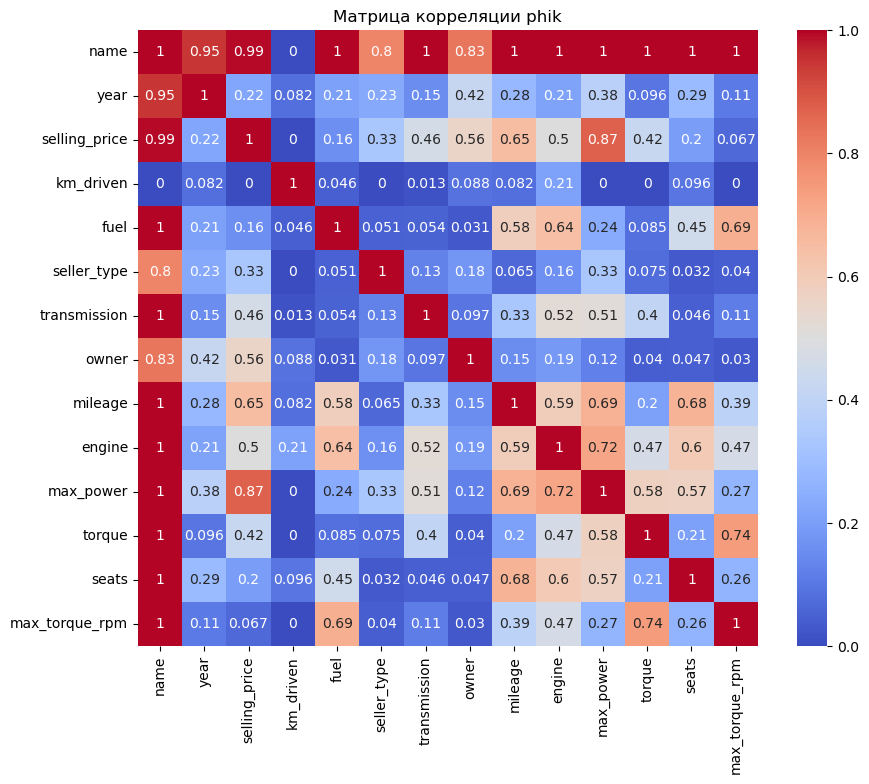

In [317]:
phik_matrix = df_train.phik_matrix()
print('Корреляция phik целевой переменной selling_price\n', phik_matrix['selling_price'])

plt.figure(figsize=(10, 8))
sns.heatmap(phik_matrix, 
            annot=True,      
            cmap='coolwarm'            
           ) 
plt.title('Матрица корреляции phik')
plt.show()

Матрица phik трудно интерпретируема, так как показывает высокие корреляции там, где много уникальных значений, например, name почти со всеми признаками имеею значимую корреляцию. Но по числовым признакам данные схожи с корреляцией по Пирсону. Например, **max_power** и **selling_price** (Пирсон: 0.69, phik: 0.87), **engine и max_power** (Пирсон: 0.68, phik: 0.72), в обоих случаях сильная связь. 

Кореляция Спирмена подходит для монотонных нелинейных зависимостей, она показала сильную зависимость year и selling_price (0.7)

### **Дополнительные визуализации (0.3 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.

In [ ]:
# your code here

# **Часть 2 (5.4 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.15 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [48]:
numeric_features = ['year', 'km_driven', 
                    'mileage', 'engine', 'max_power','torque', 'seats', 'max_torque_rpm']

In [49]:
y_train = df_train['selling_price'].copy()
X_train = df_train[numeric_features].copy()

In [50]:
assert X_train.shape == (5840, 8)

In [51]:
y_test = df_test['selling_price'].copy()
X_test = df_test[numeric_features].copy()

In [52]:
assert X_test.shape == (1000, 8)

### **Задание 12. (0.6 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [53]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

lr = LinearRegression()
lr.fit(X_train, y_train)

y_train_pred = lr.predict(X_train)
y_test_pred = lr.predict(X_test)

r2_train = r2_score(y_train, y_train_pred)
mse_train = MSE(y_train, y_train_pred)

r2_test = r2_score(y_test, y_test_pred)
mse_test = MSE(y_test, y_test_pred)

print(f'Train R2: {r2_train:.4f}')
print(f'Train MSE: {mse_train:.2f}')
print(f'Test R2: {r2_test:.4f}')
print(f'Test MSE: {mse_test:.2f}')

Train R2: 0.6012
Train MSE: 114316759232.71
Test R2: 0.6007
Test MSE: 229552628540.65


`Модель регрессии показала R2 = 0.60 как на обучающей, так и на тестовой выборке. Так как значения очень похожи, можем сделать вывод, что модель не переобучена. Модель объясняет примерно 60% дисперсии цены. MSE на test в 2 раза выше, чем на train — это связано с тем, что MSE чувствителен к масштабу. Качество можно улучшить добавлением категориальных признаков.`

### **Задание 13 (0.45 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

In [54]:
def r2_manual(y_true, y_pred):
    ss_res = np.sum((y_true - y_pred) ** 2)
    ss_tot = np.sum((y_true - np.mean(y_true)) ** 2)
    return 1 - (ss_res / ss_tot)


print(f'R2 manual: {r2_manual(y_train, y_train_pred):.4f}')
print(f'R2 sklearn: {r2_score(y_train, y_train_pred):.4f}')

R2 manual: 0.6012
R2 sklearn: 0.6012



Формула R2:
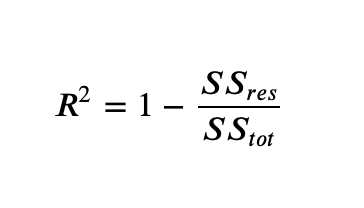
R^2 = 1 - SSres/SStot

Компоненты метрики:
- **SSres (сумма квадратов остатков)** — показывает, насколько предсказания модели отклоняются от истинных значений. Чем меньше SSres, тем точнее модель.
- **SStot (общая сумма квадратов)** — показывает, насколько истинные значения отклоняются от своего среднего. Это дисперсия целевой переменной, которую модель пытается объяснить.

**Интерпретация:**
- R2 = 1 — идеальная модель, ошибок нет
- R2 = 0 — модель предсказывает просто среднее значение
- R2 < 0 — модель предсказывает хуже, чем просто среднее (например, если выбрана не та функция или данные нелинейны)
- R2 не может быть больше 1, потому что SSres не может быть отрицательной величиной (сумма квадратов всегда ≥ 0)

### **Бонус (0.45 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

In [ ]:
# your code here

`Your answer here`

### **Задание 14 (0.45 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

Как изменилось качество модели?

In [55]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr_scaled = LinearRegression()
lr_scaled.fit(X_train_scaled, y_train)

y_train_pred_scaled = lr_scaled.predict(X_train_scaled)
y_test_pred_scaled = lr_scaled.predict(X_test_scaled)

r2_train_scaled = r2_score(y_train, y_train_pred_scaled)
r2_test_scaled = r2_score(y_test, y_test_pred_scaled)
mse_train_scaled = MSE(y_train, y_train_pred_scaled)
mse_test_scaled = MSE(y_test, y_test_pred_scaled)

print('После стандартизации')
print(f'Train R2: {r2_train_scaled:.4f}')
print(f'Test R2: {r2_test_scaled:.4f}')
print(f'Train MSE: {mse_train_scaled:.2f}')
print(f'Test MSE: {mse_test_scaled:.2f}')

После стандартизации
Train R2: 0.6012
Test R2: 0.6007
Train MSE: 114316759232.71
Test MSE: 229552628540.65


`После стандартизации качество модели не изменилось: R2 на train и test остался прежним. Это ожидаемо, так как линейная регрессия не чувствительна к масштабированию признаков, коэффициенты пропорционально пересчитываются. Основная цель стандартизации в данном случае не улучшение качества, а возможность интерпретировать важность признаков по величине коэффициентов.`

### **Задание 15 (0.3 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве, она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [51]:
lr_scaled.coef_

array([165563.21148349, -48786.61436537,  -8420.83985077,  22828.29630495,
       331276.47633909,   4604.32694329, -29830.70950205, -59760.84598963])

In [63]:
coefficients = lr_scaled.coef_
coef_df = pd.DataFrame({
    'Признак': numeric_features,
    'Коэффициент': abs(coefficients)
})

coef_df.sort_values(by='Коэффициент', ascending = False)

,Признак,Коэффициент
4,max_power,331276.476339
0,year,165563.211483
7,max_torque_rpm,59760.845990
1,km_driven,48786.614365
6,seats,29830.709502
3,engine,22828.296305
2,mileage,8420.839851
5,torque,4604.326943


Наиболее информативным признаком оказался **max_power**, так как у него самый большой коэффициент по модулю (331 276). Это подтверждает наши гипетезы из EDA. На втором месте по важности **year** (здесь интересно, что коэффициент корреляции по Пирсону был невысокий, но по Спирмену значимый), на третьем **max_torque_rpm**.

### **Задание 16 (0.75 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [59]:
from sklearn.linear_model import Lasso
lasso = Lasso(random_state=RANDOM_STATE)
lasso.fit(X_train_scaled, y_train)

y_train_pred_lasso = lasso.predict(X_train_scaled)
y_test_pred_lasso = lasso.predict(X_test_scaled)

print('Lasso')
print(f'Train R2: {r2_score(y_train, y_train_pred_lasso):.4f}')
print(f'Test R2: {r2_score(y_test, y_test_pred_lasso):.4f}')
print(f'Train MSE: {MSE(y_train, y_train_pred_lasso):.2f}')
print(f'Test MSE: {MSE(y_test, y_test_pred_lasso):.2f}')

coef_lasso = pd.DataFrame({
    'Признак': numeric_features,
    'Коэффициент': lasso.coef_
})
print('\nКоэффициенты Lasso:')
print(coef_lasso)

Lasso
Train R2: 0.6012
Test R2: 0.6007
Train MSE: 114316759246.35
Test MSE: 229553368284.85

Коэффициенты Lasso:
          Признак    Коэффициент
0            year  165561.009411
1       km_driven  -48785.678714
2         mileage   -8417.550388
3          engine   22826.288422
4       max_power  331277.837483
5          torque    4603.690459
6           seats  -29826.741562
7  max_torque_rpm  -59758.757184


`Lasso регрессия с параметром по умолчанию не занулила ни один из коэффициентов. Все признаки остались в модели с значимыми весами. Выбранный коэффициент регуляризации слишком мал, так как занчения признаков сами по себе большие, регуляризация дает слишком маленький 'штраф' по сравнению с миллиардным MSE .`

### **Задание 17. Финальный рывок (1.2 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c десятью фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [63]:
from sklearn.model_selection import GridSearchCV

param_grid_lasso = {
    'alpha': [5.0, 10.0, 50.0, 100.0, 500.0, 1000.0, 5000.0, 10000.0]
}

grid_lasso = GridSearchCV(
    Lasso(random_state=RANDOM_STATE, max_iter=10000),
    param_grid_lasso, #паремерты alpha
    cv=10, #кол-во фолдов, на которые разбивается выборка (модель обучается 10 раз)
    scoring='r2' #метрика оценки
)

grid_lasso.fit(X_train_scaled, y_train)

print(f'Лучший параметр alpha: {grid_lasso.best_params_["alpha"]}')
print(f'Лучший R2: {grid_lasso.best_score_:.4f}')

best_lasso = grid_lasso.best_estimator_
y_test_pred_best_lasso = best_lasso.predict(X_test_scaled)
print(f'Test R2 лучшей модели: {r2_score(y_test, y_test_pred_best_lasso):.4f}')

coef_best_lasso = pd.DataFrame({
    'Признак': numeric_features,
    'Коэффициент': best_lasso.coef_
})
print('\nКоэффициенты лучшей Lasso:')
print(coef_best_lasso)

Лучший параметр alpha: 10000.0
Лучший R2: 0.5807
Test R2 лучшей модели: 0.5870

Коэффициенты лучшей Lasso:
          Признак    Коэффициент
0            year  153721.725560
1       km_driven  -39051.897601
2         mileage       0.000000
3          engine       0.000000
4       max_power  337285.259145
5          torque       0.000000
6           seats      -0.000000
7  max_torque_rpm  -46159.599936


1. Гридсерч обучил 80 моделей (10 фолдов х 8 параметров alpha)
2. Параметры GridSearch
    - Lasso(random_state=RANDOM_STATE, max_iter=10000), #регулризация Lasso
    - param_grid_lasso, #паремерты alpha, мы начинали с 5 так как по умолчанию 1, уже проверяли в прошлом Lasso
    - cv=10, #кол-во фолдов, на которые разбивается выборка (модель обучается 10 раз)
    - scoring='r2' #метрика оценки
3. Лучший коэффициент 10000, с ним занулилось 4 веса признаков: **mileage, engine, torque, seats**

**Ваша задача 2:**

- [ ] Перебором по сетке (c десятью фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [89]:
from sklearn.linear_model import ElasticNet

param_grid_elastic = {
    'alpha': [10.0, 11.37, 100.0, 1000.0, 10000.0],
    'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9, 0.95, 0.99]
}

grid_elastic = GridSearchCV(
    ElasticNet(random_state=RANDOM_STATE, max_iter=10000),
    param_grid_elastic,
    cv=10,
    scoring='r2'
)

grid_elastic.fit(X_train_scaled, y_train)

print(f'Лучшие параметры: {grid_elastic.best_params_}')
print(f'Лучший R2: {grid_elastic.best_score_:.4f}')

best_elastic = grid_elastic.best_estimator_
y_test_pred_elastic = best_elastic.predict(X_test_scaled)
print(f'Test R2 лучшей модели: {r2_score(y_test, y_test_pred_elastic):.4f}')

coef_elastic = pd.DataFrame({
    'Признак': numeric_features,
    'Коэффициент': best_elastic.coef_
})
print('\nКоэффициенты ElasticNet:')
print(coef_elastic)

Лучшие параметры: {'alpha': 11.37, 'l1_ratio': 0.99}
Лучший R2: 0.5809
Test R2 лучшей модели: 0.5745

Коэффициенты ElasticNet:
          Признак    Коэффициент
0            year  152259.403761
1       km_driven  -50925.750695
2         mileage    -172.322308
3          engine   55896.965461
4       max_power  269093.635064
5          torque   28715.825634
6           seats  -31402.293088
7  max_torque_rpm  -40739.170640


1. Гридсерч обучил **350 моделей** (5 alpha x 7 l1_ratio x 10 folds)
2. Лучшие параметры: {'alpha': 10.0, 'l1_ratio': 0.99}. Судя по l1_ratio, получилось очень близко к Lasso, веса  параметров mileage, max_power сжались сильнее остальных. 
В целом качество модели упало, она хуже стала описывает изменчивость данных 

### **Задание 18 (1.05 балла)**

Итак, вы обучили все варианты регуляризаций, доступные в sklearn, но есть и другие варианты! И следующее задание о забытой $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [ ]:
# your code here

# **Часть 3 (1.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.3 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [66]:
df_train['name'].head(5)

0           Maruti Swift Dzire VDI
1     Skoda Rapid 1.5 TDI Ambition
2        Hyundai i20 Sportz Diesel
3           Maruti Swift VXI BSIII
4    Hyundai Xcent 1.2 VTVT E Plus
Name: name, dtype: object

In [99]:
df_train['brand'] = df_train['name'].str.split().str[0]
df_test['brand'] = df_train['name'].str.split().str[0]

In [141]:
# добавим seats в категориальные и уберем из числовых
categorical_features = ['fuel', 'seller_type', 'transmission', 'owner', 'brand', 'seats']
numeric_features = ['year', 'km_driven', 'mileage','engine', 'max_power','torque','max_torque_rpm']

In [101]:
X_train_cat = df_train[numeric_features + categorical_features].copy()
X_test_cat =  df_test[numeric_features + categorical_features].copy()

In [102]:
assert X_train_cat.shape == (5840, 13)

In [103]:
X_train_cat.describe(include='object')

,fuel,seller_type,transmission,owner,brand
count,5840,5840,5840,5840,5840
unique,4,3,2,5,30
top,Diesel,Individual,Manual,First Owner,Maruti
freq,3177,5223,5336,3603,1804


### **Задание 20 (0.3 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [104]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

encoder = OneHotEncoder(drop='first', sparse=False, handle_unknown='ignore')
encoder.fit(df_train[categorical_features])
encoded_columns = encoder.get_feature_names_out(categorical_features)

X_train_encoded = encoder.transform(X_train_cat[categorical_features])
X_test_encoded = encoder.transform(X_test_cat[categorical_features])

X_train_encoded_df = pd.DataFrame(X_train_encoded, columns=encoded_columns, index=X_train_cat.index)
X_test_encoded_df = pd.DataFrame(X_test_encoded, columns=encoded_columns, index=X_test_cat.index)

### **Задание 21 (0.6 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

**Ответы**
1. OneHot-кодирование преобразует категориальную переменную с n уникальными значениями в n-1 бинарных столбцов (так как используем drop='first'). Важные правила:
- обучать encoder нужно только на train, затем применять к test (через transform)
- это предотвращает утечку информации из test в train
- также важно, что приобразование нужно будет сделать с данными прешедшими для предсказания. Т.е. перед тем как передать данные обученной моделе, нужно рпименииь тот же encoder.

2. Удалять один столбец нужно для того, тобы избежать мультиколлинеарности. Если оставить все столбцы, то сумма бинарных столбцов для каждого объекта будет равна 1, что создаст линейную зависимость между признаками. Удаляя один столбец, мы устраняем эту зависимость.

3. Да, корректно. После обучения модели можно проанализировать коэффициенты и удалить категории с маленькими весами (близкими к нулю). Это упрощает модель без потери качества. Так как данные признаки все равно не добаляют весов. Но важно удалять после обучения, предварительно проверив коэфициенты. 

### **Задание 22 (0.3 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [143]:
# ограничим данные новыми фичами (убрали seats из числовых)
X_train = df_train[numeric_features].copy()
X_test = df_test[numeric_features].copy()

In [142]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

# объединим числовые и закодированные
X_train_full = pd.concat([X_train, X_train_encoded_df], axis=1)
X_test_full = pd.concat([X_test, X_test_encoded_df], axis=1)

scaler_full = StandardScaler()
X_train_full_scaled = scaler_full.fit_transform(X_train_full)
X_test_full_scaled = scaler_full.transform(X_test_full)

param_grid = {'alpha': [0.1, 1.0, 10.0, 50.0, 100.0, 500.0, 1000.0]}
ridge = Ridge(random_state=RANDOM_STATE)
grid = GridSearchCV(ridge, param_grid, cv=10, scoring='r2')
grid.fit(X_train_full_scaled, y_train)

print(f'Лучший alpha: {grid.best_params_["alpha"]}')
best_ridge = grid.best_estimator_

y_pred = best_ridge.predict(X_test_full_scaled)
coef_best_ridge = pd.DataFrame({
    'Признак': numeric_features + list(encoded_columns),
    'Коэффициент': best_ridge.coef_
})
print('Ridge с категориальными признаками')
print(f'Train R2: {r2_score(y_train, y_train_pred):.4f}')
print(f'Test R2: {r2_score(y_test, y_pred):.4f}')
print(f'Train MSE: {MSE(y_train, y_train_pred):.2f}')
print(f'Test MSE: {MSE(y_test, y_pred):.2f}')
print(coef_best_ridge)

Лучший alpha: 500.0
Ridge с категориальными признаками
Train R2: 0.6992
Test R2: 0.3897
Train MSE: 86231820155.40
Test MSE: 350826730812.58
                         Признак    Коэффициент
0                           year  149329.421488
1                      km_driven  -32409.771730
2                        mileage   12206.779517
3                         engine   41880.549943
4                      max_power  167943.016868
5                         torque   18159.472595
6                 max_torque_rpm  -20083.293995
7                    fuel_Diesel   15039.492535
8                       fuel_LPG    6605.089764
9                    fuel_Petrol   -4165.226389
10        seller_type_Individual  -20699.833300
11  seller_type_Trustmark Dealer   -1703.010965
12           transmission_Manual  -33134.933169
13    owner_Fourth & Above Owner   -8945.024578
14            owner_Second Owner  -28088.725146
15          owner_Test Drive Car   78151.438152
16             owner_Third Owner  -14279.759

Проверим кака еще покажет себя L-1 регуляризация Lasso + GridSearch) на категориальных данных.

In [153]:
lasso = Lasso(random_state=RANDOM_STATE)
lasso.fit(X_train_full, y_train)

y_train_pred_lasso = lasso.predict(X_train_full)
y_test_pred_lasso = lasso.predict(X_test_full)

print('Lasso')
print(f'Train R2: {r2_score(y_train, y_train_pred_lasso):.4f}')
print(f'Test R2: {r2_score(y_test, y_test_pred_lasso):.4f}')
print(f'Train MSE: {MSE(y_train, y_train_pred_lasso):.2f}')
print(f'Test MSE: {MSE(y_test, y_test_pred_lasso):.2f}')

coef_lasso = pd.DataFrame({
    'Признак': numeric_features + list(encoded_columns),
    'Коэффициент': lasso.coef_
})
print('\nКоэффициенты Lasso:')
print(coef_lasso)

Lasso
Train R2: 0.7747
Test R2: 0.3741
Train MSE: 64571852824.47
Test MSE: 359761988206.56

Коэффициенты Lasso:
                         Признак   Коэффициент
0                           year  4.079140e+04
1                      km_driven -4.841957e-01
2                        mileage  2.975289e+03
3                         engine  5.782825e+01
4                      max_power  6.222591e+03
5                         torque  6.613983e+01
6                 max_torque_rpm -3.094407e+01
7                    fuel_Diesel  8.396075e+04
8                       fuel_LPG  1.780050e+05
9                    fuel_Petrol  5.866709e+04
10        seller_type_Individual -5.694234e+04
11  seller_type_Trustmark Dealer -2.845838e+04
12           transmission_Manual -7.663873e+04
13    owner_Fourth & Above Owner -4.145944e+04
14            owner_Second Owner -5.693551e+04
15          owner_Test Drive Car  3.193269e+06
16             owner_Third Owner -4.002846e+04
17                    brand_Audi  4.738423

/Users/aleksandraplotko/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.886e+14, tolerance: 1.674e+11
  model = cd_fast.enet_coordinate_descent(


`Добавление категориальных признаков через OneHotEncoding привело к переобучению: Это отражается в том, что модель  хорошо предсказывает на тренировочных данных (хорошо "знает" их), но на тестовых плохо объяснет изменчивость данных: Train R2 = 0.77, Test R2 = 0.39. Модель запомнила шумы и редкие категории из обучающей выборки, но плохо обобщается. Для улучшения необходимо увеличить регуляризацию (alpha), использовать Lasso для отбора признаков или ограничить количество категорий.
Дополнительно проверили только L1 (lasso), по качеству модели результат тот же - переобучение.`

# **Часть 4 - бонусная (3 балла) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый уникальный пункт по 0.6 балла, но не больше трех баллов в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*

  * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
  * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*

  * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
  * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*

  * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
  * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
  * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
  * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

В этом пункте также оценивается целесообразность и пояснение выбранного вами метода или методов.

In [ ]:
# your code here

`Your answer here`

# **Часть 4. | Бизнесовая (1.5 балла)**

### **Задание 23 (0.75 балла)**

В мире бизнеса очень важно давать оценку качества модели, понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, которая лучше всего решает задачу бизнеса

In [ ]:
def business_metrics(y_true, y_pred):
    # your code here

business_metrics(# your code here)

`Your answer here`

### **Задание 24 (0.75 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, которая лучше всего решает задачу бизнеса



In [ ]:
def your_business_metrics(y_true, y_pred):

business_metrics(# your code here)

`Your answer here`

# **Часть 5 (12 баллов) | Создание интерактивного приложения на Streamlit**

### **Задание 25 (9 баллов)**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (3 балла)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (3 балла)
- Визуализировать веса обученной модели (3 балла)

Протестируйте приложение на адекватность и запишите демо работы сервиса (`gif` | `mp4` | …).

In [160]:
# сохраняем лучшую модель, 
# оставили LinearRegression со стандартизацией без качественных признаков (только числовые + seats) 
# так как она дает лучший R2 и не переобучается
import pickle


# еще раз переопределяем numeric_features с seats
numeric_features = ['year', 'km_driven', 
                    'mileage', 'engine', 'max_power','torque', 'seats', 'max_torque_rpm']
X_train = df_train[numeric_features].copy()

final_scaler = StandardScaler()
X_train_final_scaled = final_scaler.fit_transform(X_train)
final_model = LinearRegression()
final_model.fit(X_train_final_scaled, y_train)

model_objects = {
    'model': final_model,
    'scaler': final_scaler,
    'feature_names': numeric_features
#     'encoder': encoder,  убрали кодирование катрегориальных и категориальные признаки, так как не используем их                
#     'categorical_features': categorical_features 
}

with open('car_pipeline.pkl', 'wb') as f:
    pickle.dump(model_objects, f)

In [155]:
# сохраняем обработанный датасет и html для виджета ProfileReport, чтобы сделать на нем визуализации в streamlit
df_train.to_csv('train_cleared.csv', index=False)
profile_train = ProfileReport(df_train, title='train report')
profile_train.to_file('eda_report_train.html')

/Users/aleksandraplotko/opt/anaconda3/lib/python3.9/site-packages/ydata_profiling/profile_report.py:365: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████| 15/15 [00:00<00:00, 172.59it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### **Задание 26 (3 балла). Оформление результатов**

**Результаты вашей работы** необходимо разместить в своём GitHub-репозитории.

Под результатами понимаем следующее:

---

#### Обязательные файлы:

1. **`.ipynb`-ноутбук** со всеми экспериментами:

   * полный EDA,
   * все шаги препроцессинга,
   * обучение и сравнение моделей,
   * сохранённые output’ы.

2. **`.pickle`-файл**, содержащий:

   * обученную модель (или пайплайн `scaler + model`);
   * параметры скейлинга;
   * любые числовые объекты, необходимые для инференса внутри Streamlit-приложения.

3. **`.md`-файл с выводами** о проделанной работе:

   * что было сделано (краткое описание каждого этапа);
   * какие результаты были получены (метрики + интерпретация);
   * что дало наибольший прирост качества;
   * что сделать не удалось и почему (это нормально и даже полезно);
   * **оценка разработанного сервиса**:

     * насколько приложение удобно в использовании;
     * что получилось визуализировать хорошо, а что — менее удачно;
     * какие ограничения или проблемы вы заметили;
     * какие улучшения планируете в следующей итерации.

4. **Streamlit-приложение** (например, `app.py`), которое можно запустить командой:

   ```bash
   streamlit run app.py
   ```
5. **заполненный requirements.txt**

В приложении должно быть:

* отображение ключевых графиков EDA;
* ввод данных (CSV или ручной ввод);
* применение модели;
* визуализация весов/коэффициентов.

**Также необходимо приложить ссылку на развернутое в StreamlitHub приложение.**


### **За что могут быть сняты баллы:**

* отсутствие `.pickle` с моделью / пайплайном
* слабая или неполная аналитика в `.md`-файле
* беспорядок в ноутбуке или неясная логика вычислений
* отсутствие файлов
* невыполнение любых других обязательных требований, указанных в описании задания
* Streamlit-приложение не развернуто / не запускается

## Заключительная часть

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Теперь можно отдохнуть и похвалить себя. Но пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой :)


Поделитесь впечатлениями о задании:
    
    
  Я усталь(
  
   Было интересно, но как будто все и сразу. 
   
   Понравился метод заполнения пропусков и обучение на разных L регуляризациях. Но совсем не успела довести модель до конца, найти лучший вариант. Еще было странно, что мы сначала работали **с числовыми признаками с одними методамии обучения модели, потом добавили категориальные, и пробуем другие методы обучение.** От этого может сложиться ощущение, что с категориальными только Ridge (l2) нужно применять. В общем немного путают задания и не дают закрепить теорию, **нет последовательности в действия**, не понятно как сравнивать модели между собой, так же у меня были ожидания, что каждый следующая регуляризация улучшит модель, а получилось наоборот, **столкнулась с переобучением, а что делать не понятно.** Получается работа не помогает закрепить знания: делай так-то и получишь то-то. 
   
   Делала несколько регрессий в рабочих проектах, там у меня R2 всегда больше 0.9, хорошо знаю бизнес область и данные, а здесь не успеваешь вникнуть, чтобы нагенерить новых признаков и улучшить качество. Хотя так и не поняла помогло бы это с переобучением или нет. 
   
   Виджет ProfileReport довольно интересный. Но как оказалось может выдавать неверные результаты и крайне неудобный для чтения в Юпитере, лучше выгружать его в html.

P.S Удачного кодинга!  
Пейте латте маккиато, пишите красивый Python!!